In [1]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [2]:
cd gdrive

/content/gdrive


In [3]:
cd MyDrive

/content/gdrive/MyDrive


Preprocessing

In [4]:
import pandas as pd
import numpy as np
import plotly.graph_objs as pt
import plotly
import plotly.express as ex
from textblob import TextBlob
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
import matplotlib.pyplot as mp
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB
pkl=pd.read_pickle('redditDataset.pkl')
nltk.download('stopwords')
nltk.download('punkt')
import pickle


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Section 2

In [6]:
b=pd.read_csv("Brightkite_totalCheckins.txt", sep="\t" ,names=["id", "check_in","latitude","longitude","loc_id"])
b.head(3)

,id,check_in,latitude,longitude,loc_id
0,0,2010-10-17T01:48:53Z,39.747652,-104.992510,88c46bf20db295831bd2d1718ad7e6f5
1,0,2010-10-16T06:02:04Z,39.891383,-105.070814,7a0f88982aa015062b95e3b4843f9ca2
2,0,2010-10-16T03:48:54Z,39.891077,-105.068532,dd7cd3d264c2d063832db506fba8bf79


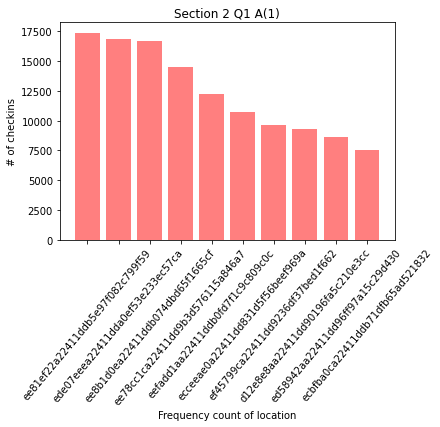

In [15]:
# dis_id=np.unique(b['latitude', 'longitude'])
count_loc=b['loc_id'].value_counts()[1:11]
loc_id=b['loc_id'].value_counts().index[1:11]
mp.bar(loc_id,count_loc,color='r', align = 'center', alpha = 0.5)
mp.xlabel('Frequency count of location')
mp.ylabel("# of checkins")
mp.xticks(rotation = 50)
mp.title("Section 2 Q1 A(1)")
mp.show()

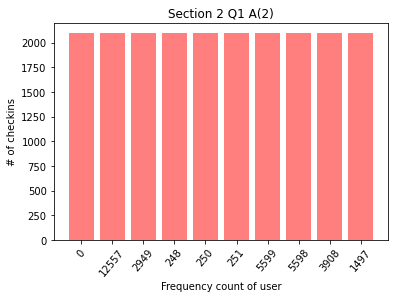

In [16]:
count_user=b['id'].value_counts().head(10)
user_id=b['id'].value_counts().index[:10].to_numpy().astype("str")
mp.bar(user_id,count_user,color='r', align = 'center', alpha = 0.5)
mp.xlabel('Frequency count of user')
mp.ylabel("# of checkins")
mp.xticks(rotation = 50)
mp.title("Section 2 Q1 A(2)")
mp.show()

Heatmap

In [9]:
dic_loc={}

for i in range(len(b)):
  s=""
  s=str(b['latitude'][i])+" "+str(b['longitude'][i])
  if s not in dic_loc:
    dic_loc[s]=1
  else:
    dic_loc[s]+=1

In [10]:
sortl=sorted(dic_loc.items(),key=lambda item: item[1], reverse=True)
sortl=sortl[1:len(sortl)]
df=[]
for i in range(len(sortl)):
  tem=[]
  ts=sortl[i][0].split(" ")
  tem.append(float(ts[0]))
  tem.append(float(ts[1]))
  tem.append(sortl[i][1])
  df.append(tem)

data=pd.DataFrame(df, columns=["lat", "long", "freq"])
len(data)
data.head(3)

,lat,long,freq
0,37.774929,-122.419415,17396
1,40.714269,-74.005973,16908
2,39.739154,-104.984703,16687


In [11]:
fig=ex.density_mapbox(data[:600000],lat='lat', lon='long', z='freq',
                      radius=10,center=dict(lat=0,lon=180), zoom=0, mapbox_style="stamen-terrain")
fig.show()

In [17]:
user_time=[]
for i in range(len(b)):
  if(b['id'][i]==user_id[0]):
    user_time.append(b['check_in'][i])

loc_time=[]
for i in range(len(b)):
  if(b['loc_id'][i]==loc_id[0]):
    loc_time.append(b['check_in'][i])

In [13]:

temp_ar1 = pd.to_datetime(user_time).values
date={}
for i in range(len(temp_ar1)):
  temp_ar12=str(pd.Timestamp(np.datetime64(temp_ar1[i])))
  templ=temp_ar12.split(" ")
  if templ[0] in date:
    date[templ[0]]+=1
  else:
    date[templ[0]]=1
#date

sort_len = sorted(date.items(), key=lambda x: x[0], reverse=False)


top_words=[]
top_frq=[]
for i in range(len(sort_len)):
  top_frq.append(sort_len[i][1])
  top_words.append(sort_len[i][0])
print(top_words)
print(top_frq)
fig = pt.Figure([pt.Scatter(x=top_words, y=top_frq)])
fig.show()

['2009-05-25', '2009-05-26', '2009-05-27', '2009-05-28', '2009-05-29', '2009-05-30', '2009-05-31', '2009-06-01', '2009-06-02', '2009-06-03', '2009-06-04', '2009-06-05', '2009-06-06', '2009-06-07', '2009-06-08', '2009-06-09', '2009-06-10', '2009-06-11', '2009-06-12', '2009-06-13', '2009-06-14', '2009-06-15', '2009-06-16', '2009-06-17', '2009-06-18', '2009-06-19', '2009-06-20', '2009-06-21', '2009-06-22', '2009-06-23', '2009-06-24', '2009-06-25', '2009-06-26', '2009-06-27', '2009-06-28', '2009-06-29', '2009-06-30', '2009-07-01', '2009-07-02', '2009-07-03', '2009-07-04', '2009-07-05', '2009-07-06', '2009-07-07', '2009-07-08', '2009-07-09', '2009-07-10', '2009-07-11', '2009-07-12', '2009-07-13', '2009-07-14', '2009-07-15', '2009-07-16', '2009-07-17', '2009-07-20', '2009-07-21', '2009-07-22', '2009-07-23', '2009-07-24', '2009-07-25', '2009-07-27', '2009-07-29', '2009-07-30', '2009-07-31', '2009-08-01', '2009-08-02', '2009-08-03', '2009-08-05', '2009-08-06', '2009-08-09', '2009-08-10', '2009

In [14]:
temp_ar1 = pd.to_datetime(loc_time).values
date={}
for i in range(len(temp_ar1)):
  temp_ar12=str(pd.Timestamp(np.datetime64(temp_ar1[i])))
  templ=temp_ar12.split(" ")
  if templ[0] in date:
    date[templ[0]]+=1
  else:
    date[templ[0]]=1
#date

sort_len = sorted(date.items(), key=lambda x: x[0], reverse=False)


top_words=[]
top_frq=[]
for i in range(len(sort_len)):
  top_frq.append(sort_len[i][1])
  top_words.append(sort_len[i][0])
print(top_words)
print(top_frq)
fig = pt.Figure([pt.Scatter(x=top_words, y=top_frq)])
fig.show()

['2008-04-14', '2008-04-16', '2008-04-18', '2008-04-19', '2008-04-20', '2008-04-21', '2008-04-22', '2008-04-23', '2008-04-24', '2008-04-25', '2008-04-26', '2008-04-27', '2008-04-28', '2008-04-29', '2008-04-30', '2008-05-01', '2008-05-02', '2008-05-03', '2008-05-04', '2008-05-05', '2008-05-06', '2008-05-07', '2008-05-08', '2008-05-09', '2008-05-10', '2008-05-11', '2008-05-12', '2008-05-13', '2008-05-14', '2008-05-15', '2008-05-16', '2008-05-17', '2008-05-18', '2008-05-19', '2008-05-20', '2008-05-21', '2008-05-22', '2008-05-23', '2008-05-24', '2008-05-25', '2008-05-26', '2008-05-27', '2008-05-28', '2008-05-29', '2008-05-30', '2008-05-31', '2008-06-01', '2008-06-02', '2008-06-03', '2008-06-04', '2008-06-05', '2008-06-06', '2008-06-07', '2008-06-08', '2008-06-09', '2008-06-10', '2008-06-11', '2008-06-12', '2008-06-13', '2008-06-14', '2008-06-15', '2008-06-16', '2008-06-17', '2008-06-18', '2008-06-19', '2008-06-20', '2008-06-21', '2008-06-22', '2008-06-23', '2008-06-24', '2008-06-25', '2008